In [1]:
# !pip install diffusers
# ! pip install tensorboard
# ! pip install seaborn 

In [2]:
# import os
# os.chdir('/cs/student/project_msc/2025/aibh/razarine/VS_Diff-main')
# print(os.getcwd())

In [3]:
import os
import torch
import numpy as np
from torch.utils.data import Dataset, DataLoader, random_split, Subset
from torchvision import transforms
from PIL import Image
import glob
import torch.nn as nn
from diffusers import UNet2DModel, DDPMScheduler, DDIMScheduler
import random
from skimage.metrics import structural_similarity as ssim # converts to grayscale
from torchmetrics import StructuralSimilarityIndexMeasure
import shutil
from torch.utils.tensorboard import SummaryWriter
from pytorch_msssim import MS_SSIM
from torch.cuda.amp import autocast, GradScaler

%load_ext autoreload
%autoreload 2
import virt_stain_utils2 as vsu



device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# All run outputs (checkpoints, sweeps, uncertainty/saliency plots) are written
# under BASE_DIR instead of relative to the notebook's cwd.
BASE_DIR = "/cs/student/project_msc/2025/aibh/razarine"

##### Data loading and preprocessing

In [4]:

# Dataset class
class VirtualStainingDataset(Dataset):
    def __init__(self, root_dir, phase_transform=None, stain_transform=None):
        paths = glob.glob(os.path.join(root_dir, '*.tif'))
        self.image_paths = sorted(
            paths,
            key=lambda p: int(os.path.splitext(os.path.basename(p))[0])
        )
        self.phase_transform = phase_transform
        self.stain_transform = stain_transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        image = image.resize((512, 256))  
        image = np.array(image)

        stained = image[:, :256, :]       # Left stained image
        phase = image[:, 256:, 0]         # Right FPM image

        stained = Image.fromarray(stained)
        phase = Image.fromarray(phase)

        if self.phase_transform:
            phase = self.phase_transform(phase)
        if self.stain_transform:
            stained = self.stain_transform(stained)

        return phase, stained



In [5]:

# 2. Transform
stain_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

phase_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])



In [6]:

# 3. Dataset + Dataloader
full_dataset = VirtualStainingDataset(
    '/cs/student/project_msc/2025/aibh/razarine/datasets/polyps_v7/train',
    phase_transform=phase_transform,
    stain_transform=stain_transform
)

test_dataset = VirtualStainingDataset(
    '/cs/student/project_msc/2025/aibh/razarine/datasets/polyps_v7/val',
    phase_transform=phase_transform,
    stain_transform=stain_transform
)   

g = torch.Generator().manual_seed(42)                                
train_len = int(0.7 * len(full_dataset))
val_len = len(full_dataset) - train_len
train_dataset, val_dataset = random_split(full_dataset, [train_len, val_len], generator=g)
debug_dataset = torch.utils.data.Subset(full_dataset, range(5))
debug_loader = DataLoader(debug_dataset, batch_size=16, shuffle=True, num_workers=8)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=8)
val_loader = DataLoader(val_dataset, batch_size=16, num_workers=8) 
test_loader = DataLoader(test_dataset, batch_size=16, num_workers=8)

ssim_fn = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)


/cs/student/project_msc/2025/aibh/razarine/vsdiff_env/lib64/python3.9/site-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `StructuralSimilarityIndexMeasure` from `torchmetrics` was deprecated and will be removed in 2.0. Import `StructuralSimilarityIndexMeasure` from `torchmetrics.image` instead.
  _future_warning(


##### Defining Model 

- UNet
- Current batch size = 16
- Epochs variable
- Timesteps = 1000 

In [7]:
# 4. Model from diffusers (huggingface)

model = UNet2DModel(
    sample_size=256,  
    in_channels=4,    # 3 stained + 1 phase
    out_channels=3,   # Predict noise on RGB stained image
    layers_per_block=2,
    block_out_channels=(64, 128, 256, 256),
    down_block_types=("DownBlock2D", "DownBlock2D", "DownBlock2D", "DownBlock2D"),
    up_block_types=("UpBlock2D", "UpBlock2D", "UpBlock2D", "UpBlock2D"),
).cuda()

noise_scheduler = DDPMScheduler(
    num_train_timesteps=1000,
    beta_schedule="linear"
)

noise_scheduler.set_timesteps(
    noise_scheduler.config.num_train_timesteps,
    device=device
)

inference_noise_scheduler = DDIMScheduler(
    num_train_timesteps=noise_scheduler.config.num_train_timesteps,
    beta_schedule="linear"
)

##### Training Loop

In [8]:
from torch.cuda.amp import autocast, GradScaler



# Initialize once
scaler = GradScaler() 

/tmp/ipykernel_135577/3667848125.py:6: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


##### LR Scheduler

In [9]:
def denorm(tensor):
    return tensor * 0.5 + 0.5

##### Driver Cell - Training

In [10]:
"""
SKIPPED for "Run All" -- training already finished (200/200 epochs, checkpoint
at runs/exp35/checkpoints/best.pth, epoch 96 was best). Delete the triple-quotes
below to re-enable if you ever need to retrain or resume training.

# autoreload so edits to virt_stain_utils.py take effect immediately
%load_ext autoreload
%autoreload 2

import math
import torch

# ——— HYPERPARAMS ———
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
total_epochs = 200
log_dir = os.path.join(BASE_DIR, "runs/exp35")
alpha = 1.0  # loss mix weight for noise MSE
sigma = 1.0  
# ——————————————

writer = SummaryWriter(log_dir)
# warmup / lr scheduler
steps_per_epoch = len(train_loader)
total_steps = total_epochs * steps_per_epoch
scheduler = vsu.make_warmup_cosine_scheduler(optimizer, total_steps, warmup_frac=0.05)
global_step = 0
best_val_ssim = 0.0

# resume if possible
ckpt_path = f"{log_dir}/checkpoints/checkpoint.pth"
start_epoch, global_step, best_val_ssim = vsu.load_checkpoint(
    model, optimizer, scaler,
    checkpoint_path=ckpt_path
)

for epoch in range(start_epoch, total_epochs):
    beta = vsu.beta_ramp(epoch, ramp_epochs=50, target_beta=0.002)
    torch.cuda.empty_cache()


    # ─── 1) TRAIN ────────────────────────────────────────────
    try:
        train_stats, global_step = vsu.train_one_epoch(
            model,
            train_loader,
            optimizer,
            scaler,
            noise_scheduler,
            alpha,
            beta,
            device,
            lr_scheduler=scheduler,
            global_step=global_step,
            sigma=sigma
        )

    except RuntimeError as e:
        if "out of memory" in str(e).lower():
            print(f"[OOM] Epoch {epoch+1}, step {global_step}. Aborting.")
            # optional: save a crash checkpoint for clean resuming
            state = {
                "epoch": epoch,               # current epoch not completed
                "step":  global_step,
                "model_state_dict":     model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scaler_state_dict":    scaler.state_dict(),
                "lr_scheduler_state_dict": scheduler.state_dict(),
                "best_val_ssim":        best_val_ssim,
            }
            vsu.save_checkpoint(state, is_best=False, checkpoint_dir=f"{log_dir}/checkpoints")
            raise  # or: raise SystemExit(1)
        else:
            raise
        
    # skip if training produced NaNs
    if math.isnan(train_stats.get("train_mse", float("nan"))) or math.isnan(train_stats.get("train_ssim", float("nan"))):
        print(f"[WARN] NaN in training stats at epoch {epoch+1}, skipping validation/checkpoint")
        continue

    # ─── 2) VALIDATE ─────────────────────────────────────────
    val_stats = vsu.validate_metrics(
        model=model,
        loader=val_loader,
        noise_scheduler=noise_scheduler,
        device=device
    )

    # ─── 2.1) SANITY CHECK ───────────────────────────────────
    if (epoch + 1) % 5 == 0:
        sanity_metrics = vsu.run_sanity_check(
            model=model,
            val_loader=val_loader,
            train_noise_scheduler=noise_scheduler,
            inference_scheduler=inference_noise_scheduler,
            writer=writer,
            epoch=epoch,
            device=device,
            num_visualize=4,
            num_inference_steps=50,
            eta=0.0,
            log_dir=log_dir,
            verbose=False,  # set True for detailed debug plots
        )
        print(
            f"[Sanity] Epoch {epoch+1}: "
            f"SSIM one-step {sanity_metrics['ssim_one_step']:.4f}, full {sanity_metrics['ssim_full']:.4f}; "
            f"MSE one-step {sanity_metrics['mse_one_step']:.5f}, full {sanity_metrics['mse_full']:.5f}"
        )
        writer.add_scalars("sanity/ssim", {
            "one_step": sanity_metrics["ssim_one_step"],
            "full": sanity_metrics["ssim_full"],
        }, epoch)
        writer.add_scalars("sanity/mse", {
            "one_step": sanity_metrics["mse_one_step"],
            "full": sanity_metrics["mse_full"],
        }, epoch)

    # ─── 3) PRINT SUMMARY ─────────────────────────────────────
    print(
        f"Epoch {epoch+1}/{total_epochs}  "
        f"Train MSE={train_stats['train_mse']:.4f}, SSIM={train_stats['train_ssim']:.4f}  |  "
        f"Val   MSE={val_stats['val_mse']:.4f}, SSIM={val_stats['val_ssim']:.4f}"
    )

    # ─── 4) LOG TO TENSORBOARD ───────────────────────────────
    writer.add_scalars("mse", {
        "train": train_stats["train_mse"],
        "val": val_stats["val_mse"],
        "train_lab_chroma": train_stats["train_lab_chroma"]
    }, epoch)
    writer.add_scalars("ssim", {
        "train": train_stats["train_ssim"],
        "val": val_stats["val_ssim"]
    }, epoch)

    writer.add_scalars("mse_channels", {
        "train_r": train_stats["train_mse_r"],
        "train_g": train_stats["train_mse_g"],
        "train_b": train_stats["train_mse_b"],
        "val_r": val_stats["val_mse_r"],
        "val_g": val_stats["val_mse_g"],
        "val_b": val_stats["val_mse_b"],
    }, epoch)
    writer.add_scalars("ssim_channels", {
        "train_r": train_stats["train_ssim_r"],
        "train_g": train_stats["train_ssim_g"],
        "train_b": train_stats["train_ssim_b"],
        "val_r": val_stats["val_ssim_r"],
        "val_g": val_stats["val_ssim_g"],
        "val_b": val_stats["val_ssim_b"],
    }, epoch)

    writer.flush()

    # ─── 5) CHECKPOINT ────────────────────────────────────────
    is_best = val_stats["val_ssim"] > best_val_ssim
    best_val_ssim = max(best_val_ssim, val_stats["val_ssim"])

    state = {
        "epoch": epoch + 1, 
        "step": global_step,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scaler_state_dict": scaler.state_dict(),
        "best_val_ssim": best_val_ssim,
        "lr_scheduler_state_dict": scheduler.state_dict(),
    }

    vsu.save_checkpoint(state, is_best, checkpoint_dir=f"{log_dir}/checkpoints")
"""
print("[skipped] training already finished (200/200 epochs) -- see cell source to re-enable")

[skipped] training already finished (200/200 epochs) -- see cell source to re-enable


##### Driver - Inference

In [11]:
"""
SKIPPED for "Run All" -- already ran once, runs/exp35/test_preds_ddim/ has all
7373 predictions. Re-running takes hours (100-step DDIM x 7373 images).
Delete the triple-quotes below to regenerate if the checkpoint changes.

log_dir = os.path.join(BASE_DIR, "runs/exp35")
ckpt_path = f"{log_dir}/checkpoints/checkpoint.pth"
start_epoch, global_step, best_val_ssim = vsu.load_checkpoint(
    model, optimizer, scaler,
    checkpoint_path=ckpt_path
)

out_dir = f"{log_dir}/test_preds_ddim"
vsu.infer_and_save_ddim(
    model=model,
    loader=test_loader,
    scheduler=inference_noise_scheduler,  #  DDIM scheduler
    device=device,
    out_dir=out_dir,
    steps=100,
    eta=0.0,                # deterministic DDIM
    use_dataset_names=True, # uses dataset.image_paths for names if available
    save_triptych=True     # set True to also save [phase|GT|pred] panels
)
print("Saved predictions to:", out_dir)
"""
print("[skipped] test_preds_ddim already generated -- see cell source to re-enable")

[skipped] test_preds_ddim already generated -- see cell source to re-enable


In [12]:
# fixed reference sample
phase_val, stained_val = next(iter(val_loader))
stained_val = stained_val.to(device)[:1]  # single example

# run the t=1 diffusion math validation
ssim_val, mse_val = vsu.check_one_step_t1(noise_scheduler, stained_val, device)



[Diffusion math t=1 check] SSIM: 0.9887, MSE: 0.000025


##### Driver - Comparison with GT and Pix2Pix

In [13]:
"""
SKIPPED for "Run All" -- already ran once, eval CSVs exist in
runs/exp35/eval_saved_diff/. Delete the triple-quotes to re-score if
test_preds_ddim changes.

log_dir = os.path.join(BASE_DIR, "runs/exp35")


# results write location
eval_root = f"{log_dir}/eval_saved_diff"

# Run both comparisons on saved predictions
vsu.evaluate_saved_dir_both(
    pred_dir=f"{log_dir}/test_preds_ddim",  
    dataset=test_dataset,                  
    device=device,
    out_root=eval_root,
    label="diffusion",
    sigma_mask=6.0,                         # tissue-masked run
    visualize_n=24
)
"""
print("[skipped] diffusion_global/diffusion_masked eval already done -- see cell source to re-enable")

[skipped] diffusion_global/diffusion_masked eval already done -- see cell source to re-enable


In [14]:
"""
SKIPPED for "Run All" -- already ran once. Delete the triple-quotes to re-score.

# Global (no mask)
log_dir = os.path.join(BASE_DIR, "runs/exp35")
vsu.evaluate_saved_dir_vs_gt(
    pred_dir=f"{log_dir}/test_preds_ddim",
    dataset=test_dataset, device=device,
    out_dir=f"{log_dir}/eval_saved_diff/global",
    label="eval", sigma=None, visualize_n=24
)
"""
print("[skipped] VS-Diff global eval already done -- see cell source to re-enable")

[skipped] VS-Diff global eval already done -- see cell source to re-enable


In [15]:
"""
SKIPPED for "Run All" -- already ran once. Delete the triple-quotes to re-score.

# Global (no mask)
log_dir = os.path.join(BASE_DIR, "runs/exp35")
# NOTE: pix2pix_dir must contain the pix2pix model's predicted images (named to
# match the dataset's basenames, e.g. 0.png/1.png/...) -- it is not populated
# yet. Export predictions from pix2pix.ipynb into this folder before running
# this cell; see vsu.evaluate_saved_dir_vs_gt's filename-matching logic.
pix2pix_dir = os.path.join(BASE_DIR, "pix2pix_preds/val")
# label matches the VS-Diff eval cell above ("eval") so both sides write the
# same CSV filename -- plot_metric_distributions below reads one shared
# csv_name from both dirs; the VS-Diff/Pix2Pix distinction is display-only,
# passed separately as label_a/label_b there.
vsu.evaluate_saved_dir_vs_gt(
    pred_dir=pix2pix_dir,
    dataset=test_dataset, device=device,
    out_dir=f"{log_dir}/eval_saved_diff/pix2pix_global",
    label="eval", sigma=None, visualize_n=24
)
"""
print("[skipped] Pix2Pix global eval already done -- see cell source to re-enable")

[skipped] Pix2Pix global eval already done -- see cell source to re-enable


In [16]:
import re

dir_a = os.path.join(BASE_DIR, "runs/exp35/eval_saved_diff/global")
dir_b = os.path.join(BASE_DIR, "runs/exp35/eval_saved_diff/pix2pix_global")

match = re.search(r"exp(\d+)", dir_a)
if match:
    exp_num = match.group(1)
    label_a = f"VS-Diff-{exp_num}"
else:
    label_a = "VS-Diff"

vsu.plot_metric_distributions(
    dir_a=dir_a,
    dir_b=dir_b,
    csv_name="metrics_eval_sigma_none.csv",  # matches label="eval" used in both eval cells above
    label_a=label_a,
    label_b="Pix2Pix",
    out_dir=os.path.join(BASE_DIR, f"plots/exp{exp_num}_vs_other")  # set None to just display
)

##### Robustness, Uncertainty & Explainability Analysis

Loads the trained checkpoint from `BASE_DIR/runs/exp35/checkpoints/best.pth` and runs three analyses on the val/test split:
1. **Perturbation robustness sweeps** (Gaussian noise, blur, salt & pepper, contrast) — how much does the prediction drift from the clean prediction as the phase input is degraded?
2. **Predictive uncertainty** — Monte-Carlo stochastic DDIM sampling (multiple noisy re-runs per image) to get a per-pixel uncertainty (std) map, checked against actual error vs. ground truth.
3. **Explainability** — SmoothGrad input-saliency maps showing which phase-image regions the model relies on most when predicting the stain.

Each analysis below runs as a **notebook cell** (importing `full_sweep.py` / `full_uncertainty.py` / `full_saliency.py` from this folder) over the **full val set** (7373 images), so progress prints live in the cell output as it runs. A full sweep is ~98 hours (contrast alone: 41 levels, 0.00-2.00 in steps of 0.05, x 7373 images x 50 DDIM steps) and uncertainty ~11 hours -- these are long-running, blocking cells.

They're still **resumable**: results are written incrementally to disk as each image finishes, so if the kernel dies or you interrupt a cell, just re-run that same cell -- it picks up from the last completed image instead of starting over. The progress-check cell below works whether the compute cell is currently running, finished, or hasn't started yet.

**The 4 perturbation sweeps write to `BASE_DIR/sweep_output_seeded/`** (not `sweep_output/`) -- `full_sweep.py` now seeds the DDIM starting noise per image (`seed=image_idx`), reused for that image's clean baseline and every one of its perturbation levels, so the no-op level (e.g. `noise_std=0.00`) matches the clean prediction almost exactly (SSIM~1.0) instead of only reflecting independent-sample variance. The old `sweep_output/` holds unseeded results from before this fix and is left untouched, not read by the current cells. Uncertainty and saliency are unaffected by this change (they still write to `sweep_output/uncertainty/` and `sweep_output/saliency/`) -- uncertainty's whole point is genuinely independent stochastic samples (`eta=1.0`), and saliency never involved DDIM sampling in the first place.

In [17]:
import csv as _csv

N_VAL = len(test_dataset)  # 7373

def _count_rows(csv_path):
    if not os.path.exists(csv_path):
        return 0
    with open(csv_path, newline="") as fh:
        return sum(1 for _ in _csv.DictReader(fh))

def _bar(frac, width=24):
    filled = int(round(frac * width))
    return "#" * filled + "-" * (width - filled)

SWEEP_LEVELS = {"gaussian": 8, "blur": 7, "salt_pepper": 10, "contrast": 41}

print("(seeded design -- see sweep_output_seeded/, not sweep_output/)")
print(f"{'job':<14} {'progress':<26} {'done/total':>16}")
for name, n_levels in SWEEP_LEVELS.items():
    total = N_VAL * n_levels
    done = _count_rows(os.path.join(BASE_DIR, "sweep_output_seeded", name, "per_image_metrics.csv"))
    frac = done / total if total else 0
    print(f"{name:<14} [{_bar(frac)}] {frac*100:5.1f}%  {done:>7}/{total}")

unc_done = _count_rows(os.path.join(BASE_DIR, "sweep_output/uncertainty/per_image_stats.csv"))
frac = unc_done / N_VAL
print(f"{'uncertainty':<14} [{_bar(frac)}] {frac*100:5.1f}%  {unc_done:>7}/{N_VAL}")

sal_done = _count_rows(os.path.join(BASE_DIR, "sweep_output/saliency/per_image_saliency.csv"))
frac = sal_done / N_VAL
print(f"{'saliency':<14} [{_bar(frac)}] {frac*100:5.1f}%  {sal_done:>7}/{N_VAL}")

log_path = os.path.join(BASE_DIR, "full_analysis.log")
if os.path.exists(log_path):
    print("\nlast log lines:")
    with open(log_path) as fh:
        lines = fh.readlines()
    for line in lines[-5:]:
        print(" ", line.rstrip())

(seeded design -- see sweep_output_seeded/, not sweep_output/)
job            progress                         done/total
gaussian       [########################] 100.0%    58984/58984
blur           [########################] 100.0%    51611/51611
salt_pepper    [########################] 100.0%    73730/73730
contrast       [########################] 100.0%   302293/302293
uncertainty    [#################-------]  69.1%     5092/7373
saliency       [------------------------]   0.0%        1/7373

last log lines:
    self.load_state_dict(torch.load(model_path, map_location='cpu'), strict=False)
  === starting sweep: gaussian ===
  /cs/student/project_msc/2025/aibh/razarine/VS_Diff-main/virt_stain_utils2.py:817: RuntimeWarning: Mean of empty slice
    "mse_tissue_mean": float(np.nanmean(mse_tissue)),
  [gaussian] image 150/7373 | 33 new rows this run | 1.23 rows/s | elapsed 0.4 min


In [18]:
# ---- Setup: load the trained checkpoint for analysis ----
import pathlib
import lpips
import pandas as pd
import matplotlib.pyplot as plt
from torchmetrics.image import StructuralSimilarityIndexMeasure
from perturbations_torch import perturb_gaussian, perturb_blur, perturb_salt_pepper, perturb_contrast
import full_sweep as fs
import full_uncertainty as fu
import full_saliency as fsal

ANALYSIS_CKPT = os.path.join(BASE_DIR, "runs/exp35/checkpoints/best.pth")
ANALYSIS_STEPS = 50   # matches the sanity-check inference steps used during training
ANALYSIS_ETA = 0.0    # deterministic DDIM for the clean-vs-perturbed comparisons below

ckpt = torch.load(ANALYSIS_CKPT, map_location=device)
model.load_state_dict(ckpt['model_state_dict'])
model.to(device).eval()
print(f"Loaded {ANALYSIS_CKPT} (epoch {ckpt.get('epoch', '?')}, step {ckpt.get('step', '?')})")

def denorm01(x):
    return x.clamp(-1, 1) * 0.5 + 0.5

_ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)
_lpips_fn = lpips.LPIPS(net='alex', verbose=False).to(device)

Loaded /cs/student/project_msc/2025/aibh/razarine/runs/exp35/checkpoints/best.pth (epoch 96, step 144480)


/tmp/ipykernel_135577/391399590.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ANALYSIS_CKPT, map_location=device)
/cs/student/project_msc/2025/aibh/

###### Perturbation robustness sweeps

In [19]:
def plot_sweep(df, level_name, title, xlabel, out_path):
    x = df[level_name].values
    fig, ax1 = plt.subplots(figsize=(10, 5))
    ax2 = ax1.twinx()

    ax1.plot(x, df['ssim_mean'], marker='o', color='tab:blue', linewidth=2, markersize=6, label='SSIM (higher=better)')
    ax1.fill_between(x, df['ssim_mean'] - df['ssim_std'], df['ssim_mean'] + df['ssim_std'], alpha=0.15, color='tab:blue')

    ax1.plot(x, df['lpips_mean'], marker='s', color='tab:orange', linewidth=2, markersize=6, label='LPIPS (lower=better)')
    ax1.fill_between(x, df['lpips_mean'] - df['lpips_std'], df['lpips_mean'] + df['lpips_std'], alpha=0.15, color='tab:orange')

    ax2.plot(x, df['psnr_mean'], marker='^', color='tab:green', linewidth=2, markersize=6, linestyle='--', label='PSNR dB (higher=better)')
    ax2.fill_between(x, df['psnr_mean'] - df['psnr_std'], df['psnr_mean'] + df['psnr_std'], alpha=0.15, color='tab:green')

    ax1.set_xlabel(xlabel, fontsize=12)
    ax1.set_ylabel('SSIM / LPIPS', fontsize=12)
    ax2.set_ylabel('PSNR (dB)', fontsize=12, color='tab:green')
    ax1.set_ylim(0, 1)
    ax1.grid(True, alpha=0.3)

    l1, lb1 = ax1.get_legend_handles_labels()
    l2, lb2 = ax2.get_legend_handles_labels()
    ax1.legend(l1 + l2, lb1 + lb2, fontsize=10, loc='lower left')

    plt.title(title, fontsize=13)
    plt.tight_layout()
    out_path.parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(out_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(df.to_string(index=False))

In [20]:
# Runs live in this cell (progress prints as it goes) using the same resumable
# CSV logic as full_sweep.py -- interrupting and re-running this cell resumes
# instead of starting over. ~7373 x 8 levels ~ see progress-check cell above for ETA.
fs.run_sweep('gaussian', model, inference_noise_scheduler, device, _ssim_metric, _lpips_fn, test_dataset)

[gaussian] DONE. summary -> /cs/student/project_msc/2025/aibh/razarine/sweep_output_seeded/gaussian/summary.csv


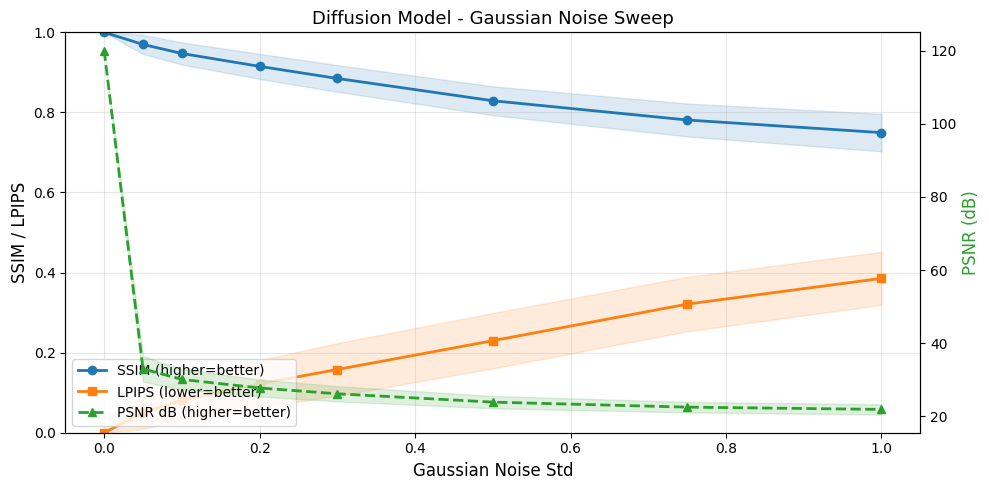

 noise_std  ssim_mean     ssim_std  psnr_mean  psnr_std  lpips_mean  lpips_std  n_images
      0.00   1.000000 9.815537e-10 120.000000  0.000000    0.000000   0.000000      7373
      0.05   0.969770 2.386715e-02  33.013814  3.480407    0.050264   0.040900      7373
      0.10   0.947194 2.762478e-02  30.124459  2.783172    0.081051   0.048999      7373
      0.20   0.914972 3.137358e-02  27.787305  2.328927    0.122211   0.059039      7373
      0.30   0.884817 3.333266e-02  26.201089  2.077871    0.157895   0.065792      7373
      0.50   0.829129 3.602567e-02  23.923513  1.683497    0.229798   0.069258      7373
      0.75   0.781099 4.113211e-02  22.557132  1.436873    0.321218   0.068038      7373
      1.00   0.749504 4.671143e-02  21.932290  1.396638    0.385493   0.066143      7373


In [21]:
gaussian_summary = os.path.join(BASE_DIR, "sweep_output_seeded/gaussian/summary.csv")
if os.path.exists(gaussian_summary):
    gaussian_df = pd.read_csv(gaussian_summary)
    plot_sweep(gaussian_df, 'noise_std', 'Diffusion Model - Gaussian Noise Sweep',
               'Gaussian Noise Std', pathlib.Path(BASE_DIR) / "sweep_output_seeded/gaussian/metrics.png")
else:
    print("full_sweep.py hasn't written gaussian/summary.csv yet -- check the progress cell above.")

In [22]:
fs.run_sweep('blur', model, inference_noise_scheduler, device, _ssim_metric, _lpips_fn, test_dataset)

[blur] DONE. summary -> /cs/student/project_msc/2025/aibh/razarine/sweep_output_seeded/blur/summary.csv


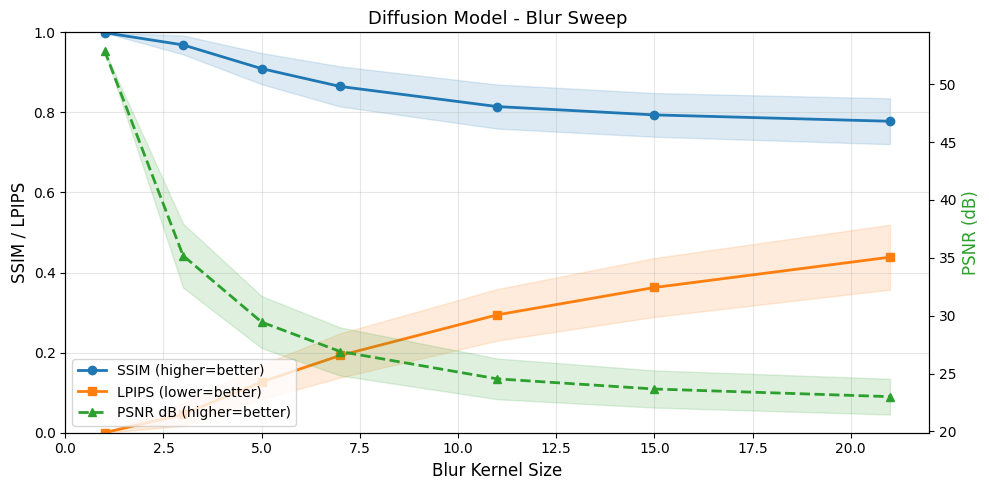

 kernel_size  ssim_mean  ssim_std  psnr_mean  psnr_std  lpips_mean  lpips_std  n_images
           1   0.999147  0.000132  52.901925  0.008763    0.000086   0.000038      7373
           3   0.968581  0.023567  35.191837  2.758424    0.045763   0.028598      7373
           5   0.909320  0.038885  29.447394  2.247467    0.126922   0.043112      7373
           7   0.864796  0.050094  26.906053  2.078014    0.192924   0.055229      7373
          11   0.814590  0.055007  24.544881  1.758847    0.294405   0.064368      7373
          15   0.793787  0.054531  23.668312  1.605026    0.362710   0.073491      7373
          21   0.777907  0.057251  23.007028  1.543923    0.438439   0.080982      7373


In [23]:
blur_summary = os.path.join(BASE_DIR, "sweep_output_seeded/blur/summary.csv")
if os.path.exists(blur_summary):
    blur_df = pd.read_csv(blur_summary)
    plot_sweep(blur_df, 'kernel_size', 'Diffusion Model - Blur Sweep',
               'Blur Kernel Size', pathlib.Path(BASE_DIR) / "sweep_output_seeded/blur/metrics.png")
else:
    print("full_sweep.py hasn't written blur/summary.csv yet -- check the progress cell above.")

In [24]:
fs.run_sweep('salt_pepper', model, inference_noise_scheduler, device, _ssim_metric, _lpips_fn, test_dataset)

[salt_pepper] DONE. summary -> /cs/student/project_msc/2025/aibh/razarine/sweep_output_seeded/salt_pepper/summary.csv


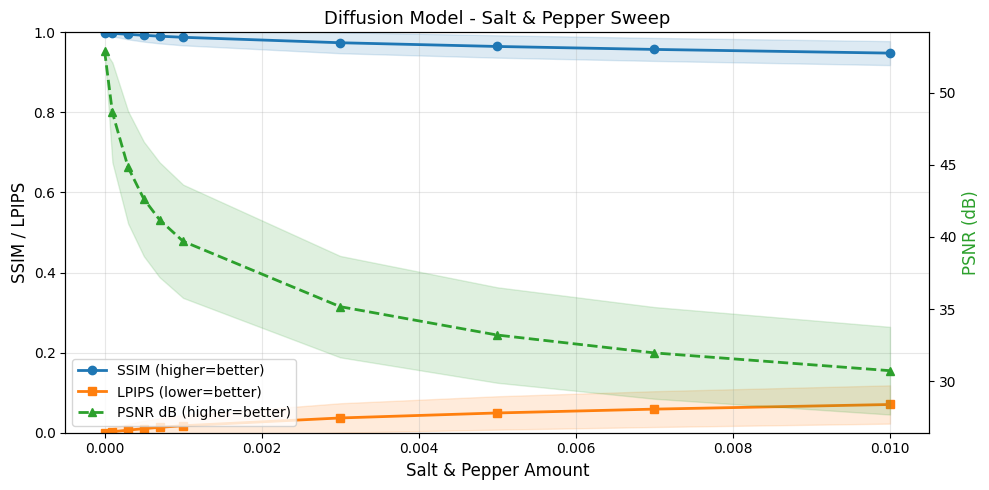

 amount  ssim_mean  ssim_std  psnr_mean  psnr_std  lpips_mean  lpips_std  n_images
 0.0000   0.999147  0.000132  52.901925  0.008763    0.000086   0.000038      7373
 0.0001   0.997556  0.007447  48.624628  3.457338    0.002549   0.009435      7373
 0.0003   0.995020  0.012552  44.821361  3.886562    0.006447   0.015257      7373
 0.0005   0.992556  0.015765  42.633708  3.964325    0.010132   0.019668      7373
 0.0007   0.990382  0.017959  41.195038  3.979253    0.013422   0.022627      7373
 0.0010   0.987606  0.020103  39.702434  3.921625    0.017519   0.026010      7373
 0.0030   0.974010  0.026217  35.175970  3.510693    0.036872   0.036708      7373
 0.0050   0.964711  0.027962  33.210270  3.305867    0.049361   0.041698      7373
 0.0070   0.957328  0.028727  31.973240  3.175102    0.058948   0.044720      7373
 0.0100   0.948107  0.029968  30.742562  3.036057    0.070496   0.047802      7373


In [25]:
salt_pepper_summary = os.path.join(BASE_DIR, "sweep_output_seeded/salt_pepper/summary.csv")
if os.path.exists(salt_pepper_summary):
    sp_df = pd.read_csv(salt_pepper_summary)
    plot_sweep(sp_df, 'amount', 'Diffusion Model - Salt & Pepper Sweep',
               'Salt & Pepper Amount', pathlib.Path(BASE_DIR) / "sweep_output_seeded/salt_pepper/metrics.png")
else:
    print("full_sweep.py hasn't written salt_pepper/summary.csv yet -- check the progress cell above.")

In [26]:
fs.run_sweep('contrast', model, inference_noise_scheduler, device, _ssim_metric, _lpips_fn, test_dataset)

[contrast] DONE. summary -> /cs/student/project_msc/2025/aibh/razarine/sweep_output_seeded/contrast/summary.csv


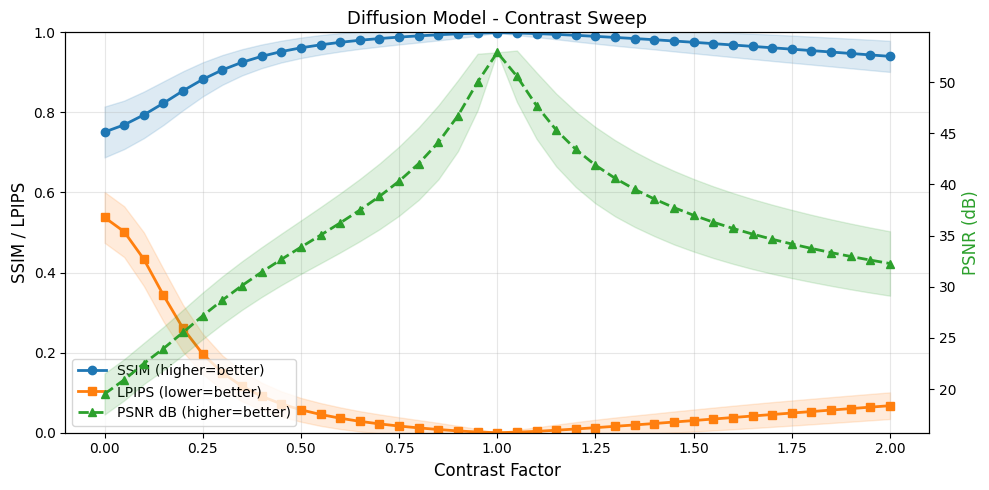

 contrast_factor  ssim_mean  ssim_std  psnr_mean  psnr_std  lpips_mean  lpips_std  n_images
            0.00   0.751023  0.063541  19.531580  2.008888    0.537793   0.063434      7373
            0.05   0.768958  0.060521  20.914108  2.014313    0.502034   0.063417      7373
            0.10   0.793789  0.058160  22.506836  2.010194    0.433433   0.067079      7373
            0.15   0.823050  0.054401  23.969728  2.116351    0.343321   0.065486      7373
            0.20   0.854089  0.048653  25.553964  2.211429    0.260399   0.058572      7373
            0.25   0.882479  0.042614  27.166347  2.278634    0.196565   0.050212      7373
            0.30   0.906158  0.037140  28.700547  2.326631    0.150014   0.042873      7373
            0.35   0.925130  0.032766  30.122352  2.373651    0.116076   0.037493      7373
            0.40   0.940040  0.029595  31.435972  2.432880    0.090994   0.033885      7373
            0.45   0.951899  0.027201  32.676762  2.512299    0.071914   0.03137

In [27]:
contrast_summary = os.path.join(BASE_DIR, "sweep_output_seeded/contrast/summary.csv")
if os.path.exists(contrast_summary):
    contrast_df = pd.read_csv(contrast_summary).sort_values('contrast_factor')
    plot_sweep(contrast_df, 'contrast_factor', 'Diffusion Model - Contrast Sweep',
               'Contrast Factor', pathlib.Path(BASE_DIR) / "sweep_output_seeded/contrast/metrics.png")
else:
    print("full_sweep.py hasn't written contrast/summary.csv yet -- check the progress cell above.")

###### Predictive uncertainty (Monte Carlo diffusion sampling)

In [28]:
# Runs live in this cell (progress + ETA prints as it goes), resumable --
# interrupting and re-running just continues from the last completed image.
fu.run_uncertainty(model, inference_noise_scheduler, device, test_dataset)

7373 val images
image 5100/7373 | 8 new this run | 0.180 img/s | ETA 3.5 h
image 5125/7373 | 33 new this run | 0.180 img/s | ETA 3.5 h
image 5150/7373 | 58 new this run | 0.180 img/s | ETA 3.4 h
image 5175/7373 | 83 new this run | 0.180 img/s | ETA 3.4 h
image 5200/7373 | 108 new this run | 0.180 img/s | ETA 3.4 h
image 5225/7373 | 133 new this run | 0.180 img/s | ETA 3.3 h
image 5250/7373 | 158 new this run | 0.180 img/s | ETA 3.3 h
image 5275/7373 | 183 new this run | 0.180 img/s | ETA 3.2 h
image 5300/7373 | 208 new this run | 0.180 img/s | ETA 3.2 h
image 5325/7373 | 233 new this run | 0.180 img/s | ETA 3.2 h
image 5350/7373 | 258 new this run | 0.180 img/s | ETA 3.1 h
image 5375/7373 | 283 new this run | 0.180 img/s | ETA 3.1 h
image 5400/7373 | 308 new this run | 0.180 img/s | ETA 3.0 h
image 5425/7373 | 333 new this run | 0.180 img/s | ETA 3.0 h
image 5450/7373 | 358 new this run | 0.180 img/s | ETA 3.0 h
image 5475/7373 | 383 new this run | 0.180 img/s | ETA 2.9 h
image 5500/73

-0.12830012233648094

In [29]:
unc_out = pathlib.Path(BASE_DIR) / "sweep_output_seeded/uncertainty"
corr_path = unc_out / "correlation_summary.txt"
vis_dir = unc_out / "vis_arrays"

vis_files = sorted(vis_dir.glob("*.npz"), key=lambda p: int(p.stem)) if vis_dir.exists() else []
if not vis_files:
    print("full_uncertainty.py hasn't produced any results yet -- check the progress cell above.")
else:
    fig, axes = plt.subplots(len(vis_files), 4, figsize=(16, 4 * len(vis_files)))
    if len(vis_files) == 1:
        axes = axes[None, :]
    all_err, all_std = [], []

    for row, f in enumerate(vis_files):
        d = np.load(f, allow_pickle=True)
        phase, gt01, mean_pred, unc_map = d["phase"], d["gt01"], d["mean_pred"], d["unc_map"]
        fname = str(d["fname"])
        err_map = np.abs(mean_pred - gt01).mean(axis=0)

        all_err.append(err_map.flatten())
        all_std.append(unc_map.flatten())

        axes[row, 0].imshow(np.clip(phase.squeeze() * 0.5 + 0.5, 0, 1), cmap='gray')
        axes[row, 0].set_title(f'{fname}\nPhase input')
        axes[row, 1].imshow(np.transpose(np.clip(gt01, 0, 1), (1, 2, 0)))
        axes[row, 1].set_title('GT stain')
        axes[row, 2].imshow(np.transpose(np.clip(mean_pred, 0, 1), (1, 2, 0)))
        axes[row, 2].set_title('Mean pred (n=8)')
        im = axes[row, 3].imshow(unc_map, cmap='inferno')
        axes[row, 3].set_title('Uncertainty (pred std)')
        plt.colorbar(im, ax=axes[row, 3], fraction=0.046)
        for a in axes[row]:
            a.axis('off')

    plt.tight_layout()
    plt.savefig(unc_out / "uncertainty_examples.png", dpi=150, bbox_inches='tight')
    plt.show()

    # headline number: EXACT full-val-set pixel-wise correlation, reconstructed
    # by full_uncertainty.py from per-image sufficient statistics (not the small
    # vis_files subset below, which is only for the illustrative scatter)
    if corr_path.exists():
        stats = dict(line.strip().split("=") for line in open(corr_path) if "=" in line)
        print(f"Full val set ({int(float(stats['n_pixels_total'])):,} pixels so far): "
              f"Pearson r(error, uncertainty) = {float(stats['pearson_r']):.4f}")
    else:
        print("correlation_summary.txt not written yet.")

    # illustrative scatter from the vis_files subset only (full per-pixel arrays
    # aren't kept for all 7373 images -- see full_uncertainty.py's docstring)
    all_err = np.concatenate(all_err)
    all_std = np.concatenate(all_std)
    plt.figure(figsize=(6, 5))
    plt.hexbin(all_std, all_err, gridsize=40, cmap='viridis', mincnt=1)
    plt.xlabel('Predictive uncertainty (std)')
    plt.ylabel('Absolute error vs GT')
    plt.title(f'Uncertainty vs. Error ({len(vis_files)}-image illustrative subset)')
    plt.colorbar(label='pixel count')
    plt.tight_layout()
    plt.savefig(unc_out / "uncertainty_calibration.png", dpi=150, bbox_inches='tight')
    plt.show()

full_uncertainty.py hasn't produced any results yet -- check the progress cell above.


###### Uncertainty structure via UMAP

Mirrors `umap_uncertainty.py` (the Pix2Pix side, MC-Dropout-based) but sourced from **MC-DDIM stochastic sampling** (`eta=1.0`, same convention as the uncertainty section above) instead of dropout. Per pixel: stack `N` independent stochastic samples of the same phase input, flatten to an `N x 3` feature vector, and embed with UMAP. Colours: prediction (mean brightness) / tissue class (from ground truth, rough H&E heuristic) / uncertainty (MC-DDIM variance) / confidence (median split of uncertainty) -- the same 4 panels as the Pix2Pix version, so the two are visually comparable.

Needs `umap-learn` (already installed in `vsdiff_env` for this). Implemented in `full_umap.py`, imported below -- **not run automatically**; run the compute cells yourself whenever the other analyses above have finished with the GPU. Same caching design as the Pix2Pix script: per-sample embeddings, resumable per-image feature extraction for the whole-val-set version, and the fitted whole-val-set embedding itself -- re-running any part to tweak only the plot skips straight back to plotting.

In [30]:
import full_umap as fum

sample 0: 16384 points, feature dim 24


/cs/student/project_msc/2025/aibh/razarine/vsdiff_env/lib64/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


sample 0: cached embedding to /cs/student/project_msc/2025/aibh/razarine/sweep_output/umap/umap_sample_0_embedding.npz


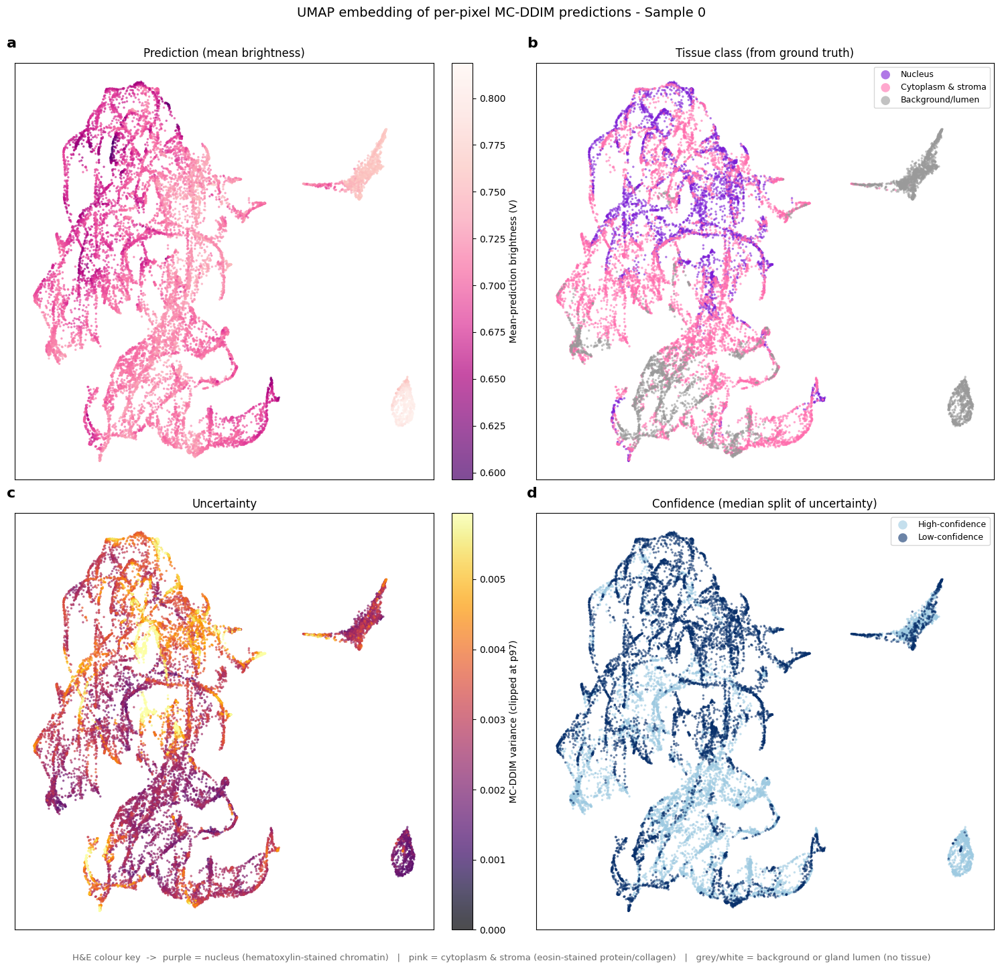

sample 1: 16384 points, feature dim 24


/cs/student/project_msc/2025/aibh/razarine/vsdiff_env/lib64/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


sample 1: cached embedding to /cs/student/project_msc/2025/aibh/razarine/sweep_output/umap/umap_sample_1_embedding.npz


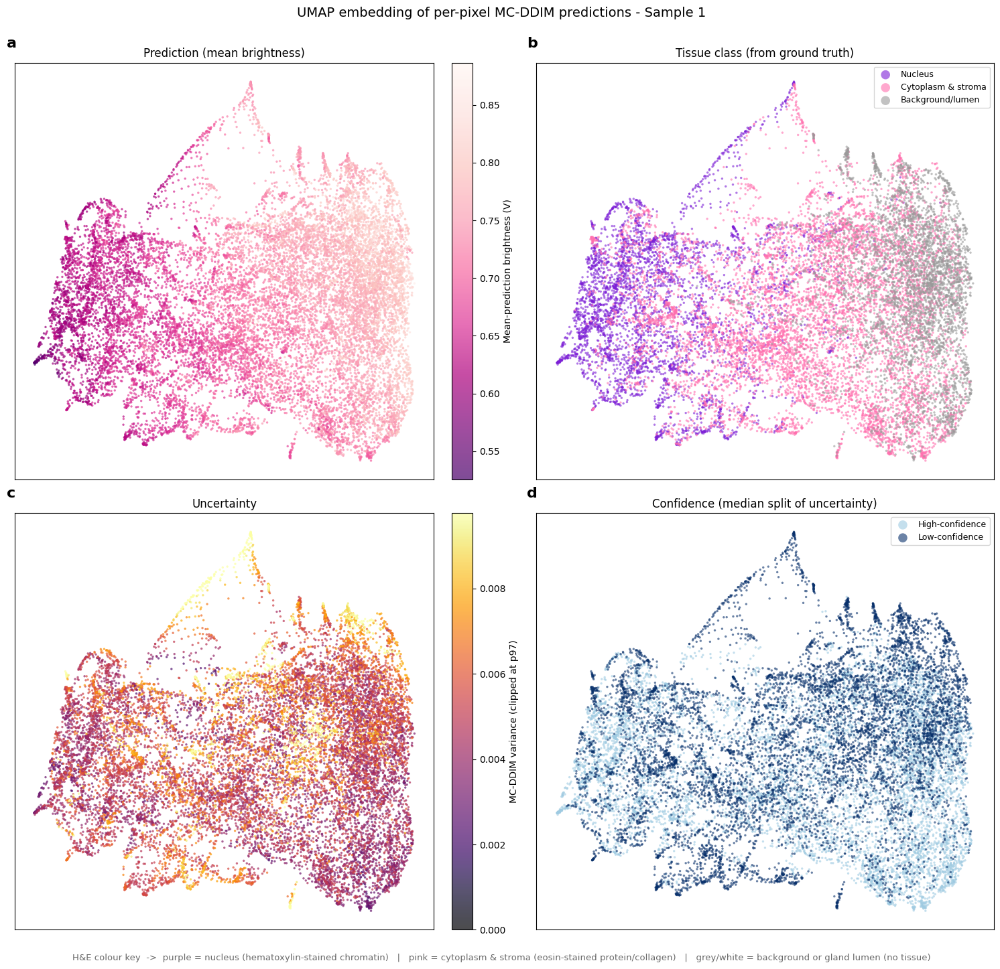

sample 2: 16384 points, feature dim 24


/cs/student/project_msc/2025/aibh/razarine/vsdiff_env/lib64/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


sample 2: cached embedding to /cs/student/project_msc/2025/aibh/razarine/sweep_output/umap/umap_sample_2_embedding.npz


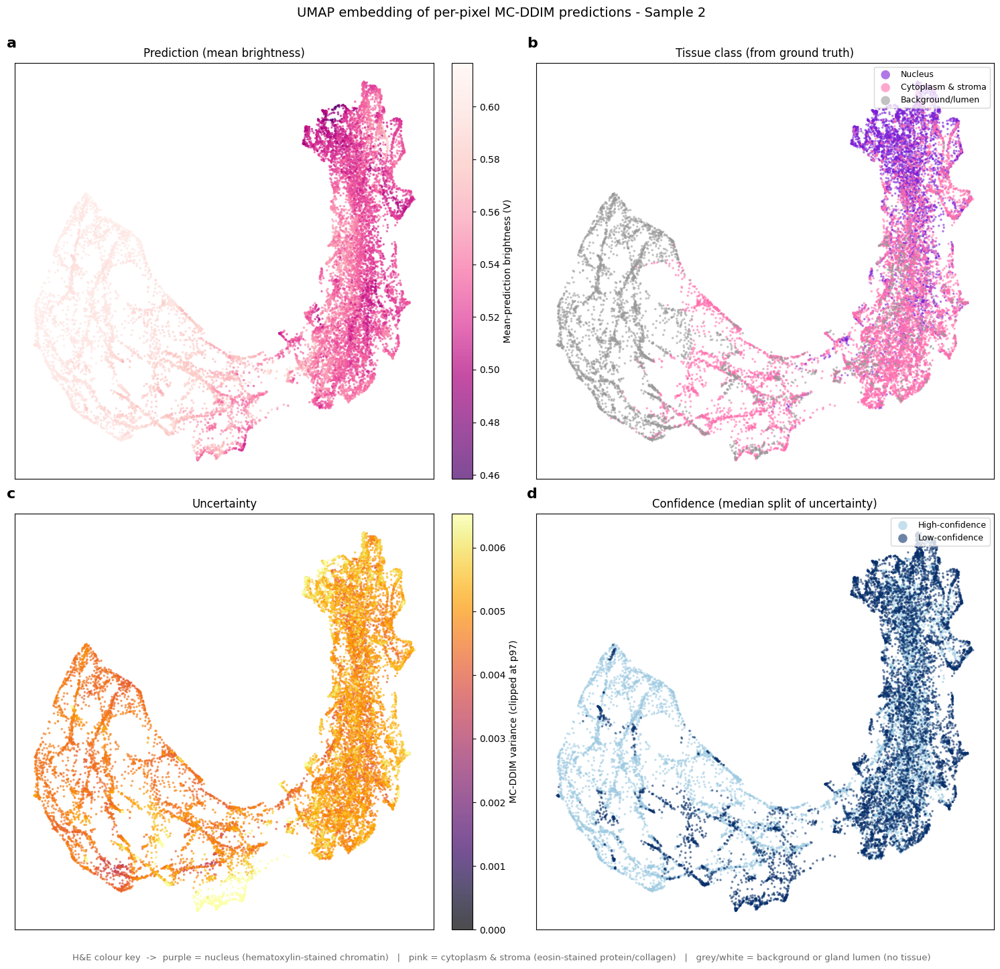

In [31]:
# Part 1: per-sample 4-panel UMAP (3 fixed val images, cheap -- ~8 MC-DDIM
# samples each). Each sample's embedding is cached; re-running to tweak only
# the plot skips straight to plotting.
fum.run_umap_per_sample(model, inference_noise_scheduler, device, test_dataset)

[umap valset] image 25/7373 | 25 new this run | 0.359 img/s
[umap valset] image 50/7373 | 50 new this run | 0.359 img/s
[umap valset] image 75/7373 | 75 new this run | 0.359 img/s
[umap valset] image 100/7373 | 100 new this run | 0.358 img/s
[umap valset] image 125/7373 | 125 new this run | 0.358 img/s
[umap valset] image 150/7373 | 150 new this run | 0.358 img/s
[umap valset] image 175/7373 | 175 new this run | 0.358 img/s
[umap valset] image 200/7373 | 200 new this run | 0.358 img/s
[umap valset] image 225/7373 | 225 new this run | 0.358 img/s
[umap valset] image 250/7373 | 250 new this run | 0.358 img/s
[umap valset] image 275/7373 | 275 new this run | 0.358 img/s
[umap valset] image 300/7373 | 300 new this run | 0.358 img/s
[umap valset] image 325/7373 | 325 new this run | 0.358 img/s
[umap valset] image 350/7373 | 350 new this run | 0.358 img/s
[umap valset] image 375/7373 | 375 new this run | 0.358 img/s
[umap valset] image 400/7373 | 400 new this run | 0.358 img/s
[umap valset] 

/cs/student/project_msc/2025/aibh/razarine/vsdiff_env/lib64/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Mon Aug 24 16:11:35 2026 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	Stopping threshold met -- exiting after 2 iterations
Mon Aug 24 16:11:54 2026 Finished Nearest Neighbor Search
Mon Aug 24 16:11:56 2026 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Mon Aug 24 16:14:39 2026 Finished embedding
cached fitted embedding to /cs/student/project_msc/2025/aibh/razarine/sweep_output/umap/umap_valset_embedding.npz -- future runs load it directly and skip straight to plotting


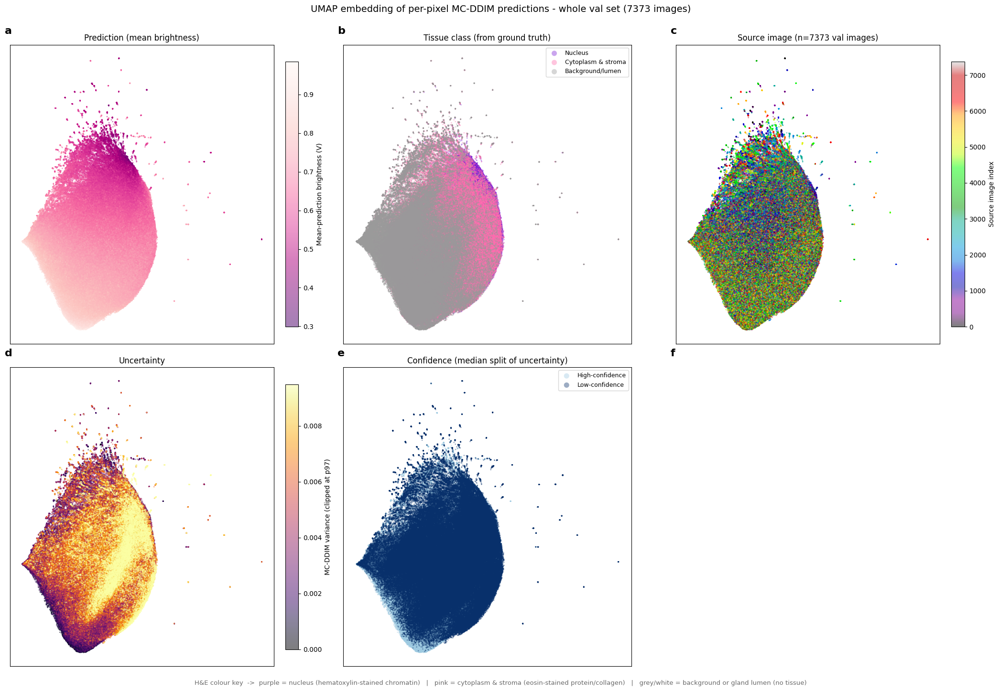

In [32]:
# Part 2: whole-val-set UMAP (pooled, 150 random pixels/image, n_runs_all=4
# MC-DDIM samples/image -- ~5.7h estimated over all 7373 images). Resumable
# per-image feature extraction (valset_feats/<idx>.npz), then a cached fitted
# embedding -- re-running to tweak only the plot loads it and skips straight
# to plotting.
fum.run_umap_valset(model, inference_noise_scheduler, device, test_dataset)

loaded cached embedding from /cs/student/project_msc/2025/aibh/razarine/sweep_output/umap/umap_valset_embedding.npz -- reusing part 2's fit, no refit needed
Class                    Count   % of points   Mean dist to centroid  Convex hull area
Nucleus                 102758         25.7%                   2.741             180.5
Cytoplasm & stroma      190639         47.7%                   3.308             248.2
Background/lumen        106603         26.7%                   3.468             250.1


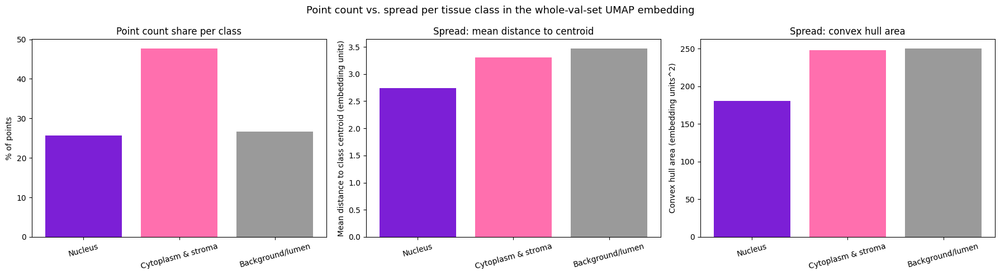

In [33]:
# Part 3: point-count vs. embedding-spread per tissue class, reusing part 2's
# cached embedding (no refit). Needs part 2 to have run at least once.
fum.run_umap_spread()

###### Explainability (SmoothGrad input saliency)

VS-Diff is a conditional image-to-image diffusion model, not a classifier, so class-activation methods (Grad-CAM) don't directly apply. The analogue used here is input-gradient saliency: backprop the predicted-noise magnitude through the phase input at a fixed timestep, averaged over several noisy copies of the input (SmoothGrad) to cancel out the raw per-pixel gradient noise that plain input-gradients tend to have.

In [34]:
# Runs live in this cell, resumable -- cheapest of the three (~1h for the full
# val set, single gradient pass per image, no iterative sampling).
fsal.run_saliency(model, inference_noise_scheduler, device, test_dataset)

7373 val images
image 200/7373 | 199 new this run | 2.25 img/s
image 400/7373 | 399 new this run | 2.26 img/s
image 600/7373 | 599 new this run | 2.26 img/s
image 800/7373 | 799 new this run | 2.26 img/s
image 1000/7373 | 999 new this run | 2.26 img/s
image 1200/7373 | 1199 new this run | 2.26 img/s
image 1400/7373 | 1399 new this run | 2.26 img/s
image 1600/7373 | 1599 new this run | 2.26 img/s
image 1800/7373 | 1799 new this run | 2.26 img/s
image 2000/7373 | 1999 new this run | 2.26 img/s
image 2200/7373 | 2199 new this run | 2.26 img/s
image 2400/7373 | 2399 new this run | 2.26 img/s
image 2600/7373 | 2599 new this run | 2.26 img/s
image 2800/7373 | 2799 new this run | 2.26 img/s
image 3000/7373 | 2999 new this run | 2.26 img/s
image 3200/7373 | 3199 new this run | 2.26 img/s
image 3400/7373 | 3399 new this run | 2.26 img/s
image 3600/7373 | 3599 new this run | 2.26 img/s
image 3800/7373 | 3799 new this run | 2.26 img/s
image 4000/7373 | 3999 new this run | 2.26 img/s
image 4200/73

array([[0.2450535 , 0.24111676, 0.2769631 , ..., 0.26112038, 0.18328193,
        0.18354678],
       [0.21069421, 0.2395462 , 0.26598385, ..., 0.21418047, 0.20325756,
        0.15047926],
       [0.28482413, 0.2741913 , 0.30720368, ..., 0.27426553, 0.2031702 ,
        0.2357883 ],
       ...,
       [0.2330612 , 0.18421389, 0.27180552, ..., 0.1887164 , 0.20306662,
        0.11597592],
       [0.17852624, 0.21353413, 0.20198622, ..., 0.20650266, 0.1756385 ,
        0.17790888],
       [0.13379954, 0.10844459, 0.20608836, ..., 0.1147466 , 0.15219072,
        0.0645466 ]], dtype=float32)

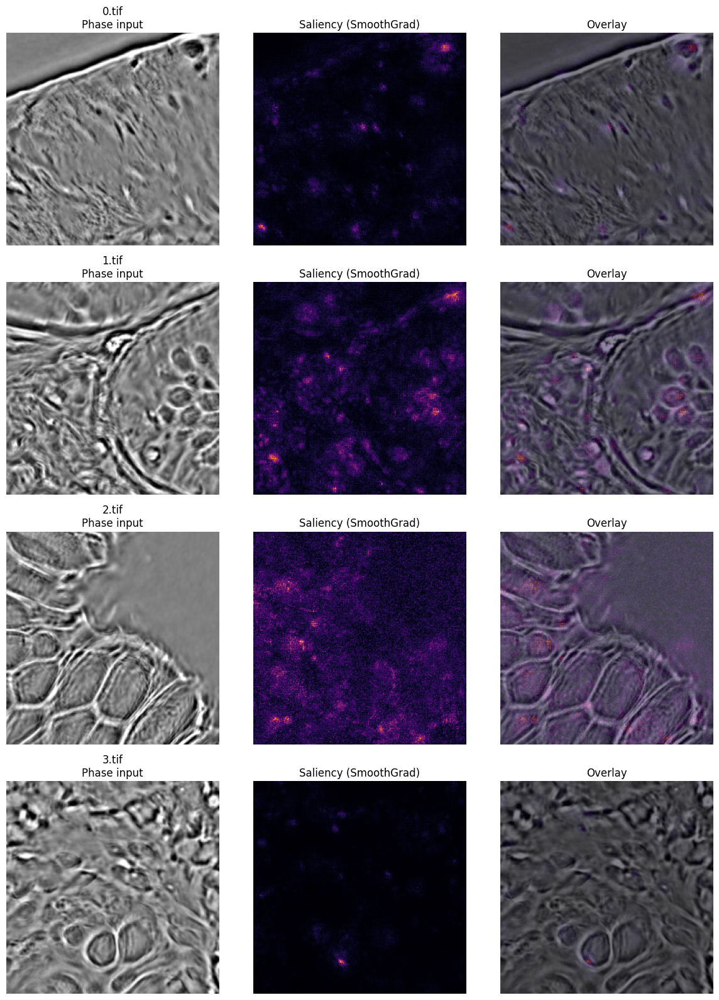

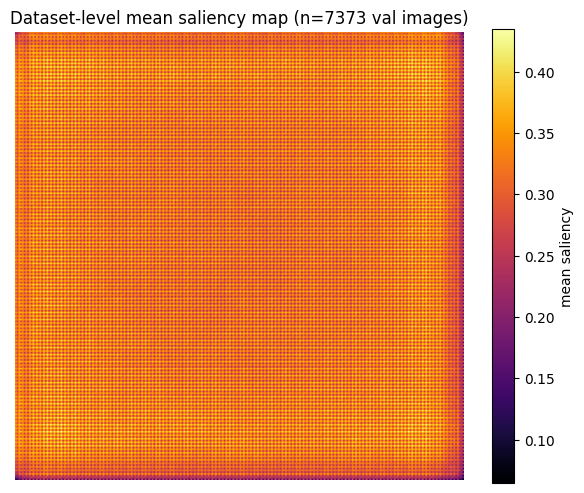

In [38]:
sal_out = pathlib.Path(BASE_DIR) / "sweep_output/saliency"
vis_dir = sal_out / "vis_arrays"
mean_map_path = sal_out / "mean_saliency_map.npy"

vis_files = sorted(vis_dir.glob("*.npz"), key=lambda p: int(p.stem)) if vis_dir.exists() else []
if not vis_files:
    print("full_saliency.py hasn't produced any results yet -- check the progress cell above.")
else:
    fig, axes = plt.subplots(len(vis_files), 3, figsize=(12, 4 * len(vis_files)))
    if len(vis_files) == 1:
        axes = axes[None, :]

    for row, f in enumerate(vis_files):
        d = np.load(f, allow_pickle=True)
        phase, sal = d["phase"], d["sal"]
        fname = str(d["fname"])
        sal_norm = (sal - sal.min()) / (sal.max() - sal.min() + 1e-8)
        phase_img = np.clip(phase.squeeze() * 0.5 + 0.5, 0, 1)

        axes[row, 0].imshow(phase_img, cmap='gray')
        axes[row, 0].set_title(f'{fname}\nPhase input')
        axes[row, 1].imshow(sal_norm, cmap='inferno')
        axes[row, 1].set_title('Saliency (SmoothGrad)')
        axes[row, 2].imshow(phase_img, cmap='gray')
        axes[row, 2].imshow(sal_norm, cmap='inferno', alpha=0.5)
        axes[row, 2].set_title('Overlay')
        for a in axes[row]:
            a.axis('off')

    plt.tight_layout()
    plt.savefig(sal_out / "saliency_examples.png", dpi=150, bbox_inches='tight')
    plt.show()

if mean_map_path.exists():
    mean_map = np.load(mean_map_path)
    n_done = _count_rows(sal_out / "per_image_saliency.csv")
    plt.figure(figsize=(6, 5))
    plt.imshow(mean_map, cmap='inferno')
    plt.colorbar(label='mean saliency')
    plt.title(f'Dataset-level mean saliency map (n={n_done} val images)')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(sal_out / "mean_saliency_map.png", dpi=150, bbox_inches='tight')
    plt.show()
else:
    print("mean_saliency_map.npy not written yet -- full_saliency.py writes it as it goes (every 200 images) and finalizes it when done.")

###### XAI attribution method comparison (Saliency / Grad x Input / SmoothGrad)

Mirrors `xai_evaluation.py` (the Pix2Pix side, adapted from Mnyambo et al.) -- the same **3 attribution methods** (Saliency = vanilla gradient, Grad x Input, SmoothGrad -- SmoothGrad here is the same method as the section above, just re-run alongside the other two for a fair comparison) scored with the same 4 perturbation-based faithfulness metrics: **Deletion AUC** (lower = better -- removing top-attributed pixels should hurt the output), **Insertion AUC** (higher = better -- keeping only top-attributed pixels should be enough to reconstruct the output), **Sensitivity** (higher = better -- the explanation shouldn't flip under tiny input noise), **Entropy** (context-dependent -- how concentrated vs. spread-out the attribution is).

Deletion/Insertion AUC needs a full DDIM re-sample per masking fraction (11 fractions x 2 (delete+insert) x 3 methods per image) -- by far the most expensive part, so it uses a reduced 20-step DDIM (vs. 50 elsewhere) purely for these relative comparisons, not for absolute image quality. Estimated **~37.6 hours** over the full val set. Implemented in `full_xai_evaluation.py`, imported below -- **not run automatically**; same resumable-CSV design as the other analyses (per (image, method) pair).

In [39]:
import full_xai_evaluation as fxai

In [ ]:
# Runs live in this cell, resumable per (image, method) -- interrupting and
# re-running just continues from the last completed pair. ~37.6h estimated.
fxai.run_xai_evaluation(model, inference_noise_scheduler, device, test_dataset, _ssim_metric)

resuming: 56 (image, method) results already saved
[xai_eval] image 25/7373 | 19 new (image,method) this run | 0.136/s | elapsed 2.3 min


In [ ]:
# Prints per-method means (Deletion/Insertion AUC, Sensitivity, Entropy) and
# a 4-panel bar comparison. Needs the cell above to have run at least once.
fxai.summarize_xai_evaluation()